# Machine Vision Lab 3
> Name - Ojas Patil
>
> Register Number - 21BAI1106

### Task 1: Introduction to Histogram Equalization

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [2]:
def plot_histogram(image, title):
    plt.hist(image.ravel(), bins=256, range=(0, 256))
    plt.title(title)
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

In [7]:
image = cv2.imread('/content/intothenight.jpg', cv2.IMREAD_GRAYSCALE)

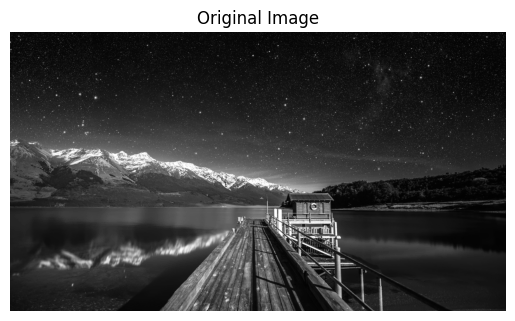

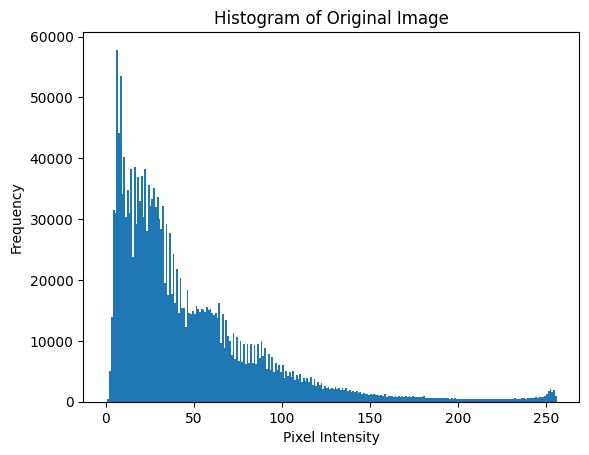

In [8]:
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

print()

plot_histogram(image, 'Histogram of Original Image')

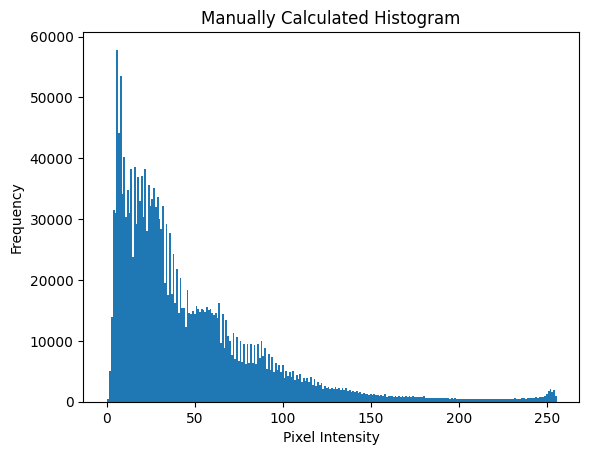

In [9]:
# manually calculated histogram

hist = np.zeros(256, dtype=int)
for pixel in image.ravel():
    hist[pixel] += 1

plt.bar(range(256), hist, width=1)
plt.title('Manually Calculated Histogram')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

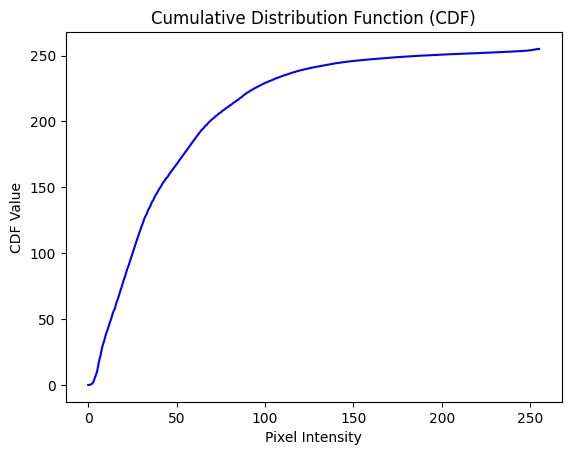

In [10]:
# CDF from the histogram
cdf = np.cumsum(hist)
cdf_normalized = cdf * 255 / cdf[-1]

plt.plot(cdf_normalized, color='b')
plt.title('Cumulative Distribution Function (CDF)')
plt.xlabel('Pixel Intensity')
plt.ylabel('CDF Value')
plt.show()

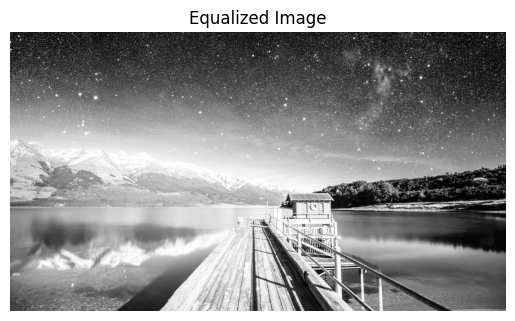

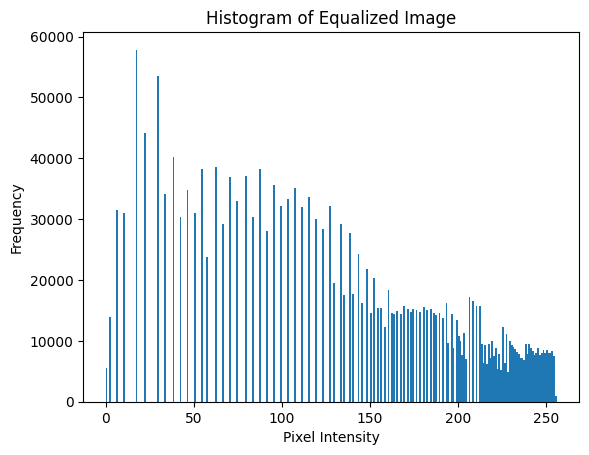

In [11]:
# Map the original pixel values to equalized pixel values using the CDF
equalized_image = np.interp(image.flatten(), range(256), cdf_normalized).reshape(image.shape)

plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')
plt.show()

print()

plot_histogram(equalized_image, 'Histogram of Equalized Image')

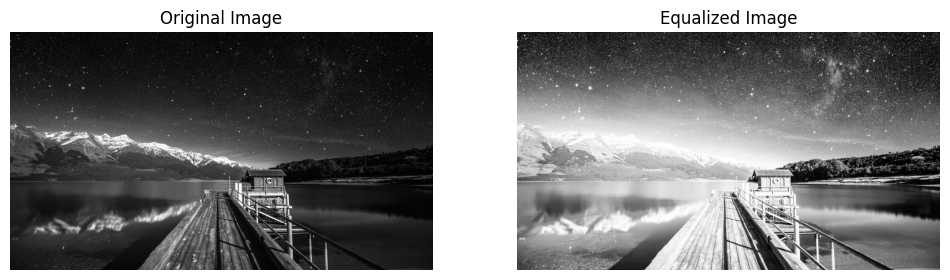

In [12]:
# Display the original and equalized images side by side for comparison
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')

plt.show()

The original image typically has lower contrast with many pixel intensities concentrated in certain ranges.
Histogram equalization redistributes the pixel intensities, enhancing the overall contrast of the image.
The histogram of the equalized image is more spread out and uniform compared to the original image histogram.

### Task 2: Comparing Histogram Equalization Techniques

In [13]:
# Applying AHE toan image
def adaptive_histogram_equalization(image, tile_size):
    h, w = image.shape
    new_image = np.zeros_like(image)

    for i in range(0, h, tile_size):
        for j in range(0, w, tile_size):
            tile = image[i:i+tile_size, j:j+tile_size]
            new_image[i:i+tile_size, j:j+tile_size] = cv2.equalizeHist(tile)

    return new_image

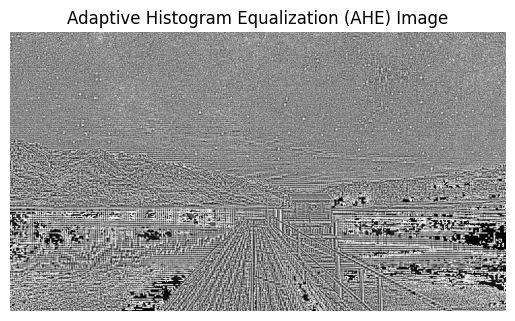

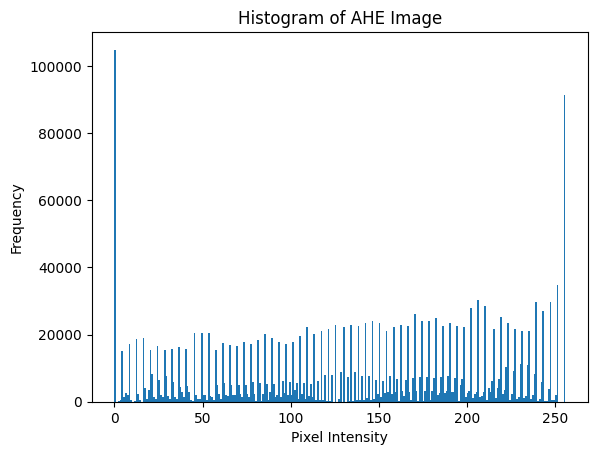

In [14]:
ahe_image = adaptive_histogram_equalization(image, 8)

plt.imshow(ahe_image, cmap='gray')
plt.title('Adaptive Histogram Equalization (AHE) Image')
plt.axis('off')
plt.show()

plot_histogram(ahe_image, 'Histogram of AHE Image')

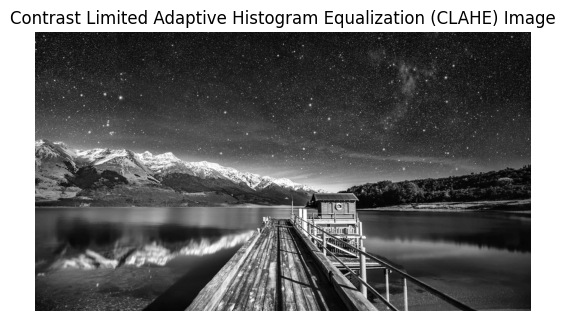

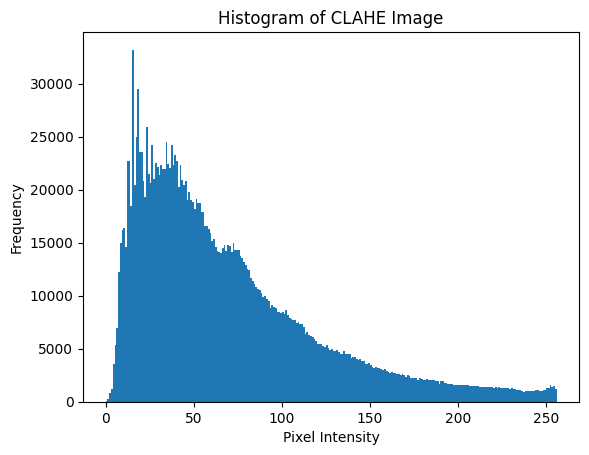

In [15]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
clahe_image = clahe.apply(image)

plt.imshow(clahe_image, cmap='gray')
plt.title('Contrast Limited Adaptive Histogram Equalization (CLAHE) Image')
plt.axis('off')
plt.show()

print()

plot_histogram(clahe_image, 'Histogram of CLAHE Image')

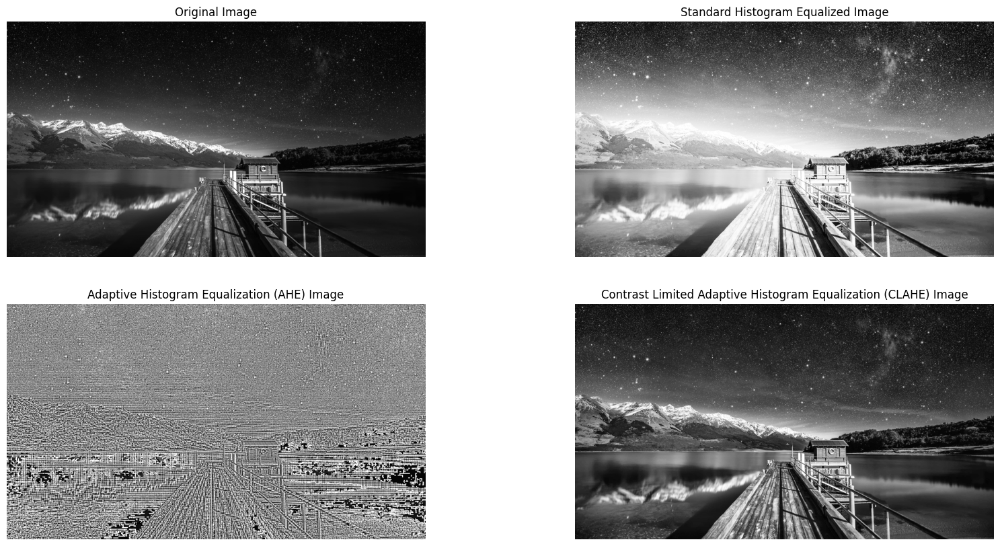

In [16]:
# Display the original, standard equalized, AHE, and CLAHE images side by side for comparison
plt.figure(figsize=(20, 10))

plt.subplot(2, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(2, 2, 2)
plt.imshow(equalized_image, cmap='gray')
plt.title('Standard Histogram Equalized Image')
plt.axis('off')

plt.subplot(2, 2, 3)
plt.imshow(ahe_image, cmap='gray')
plt.title('Adaptive Histogram Equalization (AHE) Image')
plt.axis('off')

plt.subplot(2, 2, 4)
plt.imshow(clahe_image, cmap='gray')
plt.title('Contrast Limited Adaptive Histogram Equalization (CLAHE) Image')
plt.axis('off')

plt.show()

The original image has lower contrast with pixel intensities concentrated in certain ranges.
Standard histogram equalization improves overall contrast but might not be effective in local areas.

AHE enhances contrast in local regions by applying histogram equalization to smaller tiles, leading to better local contrast.

CLAHE further enhances AHE by limiting the contrast, preventing over-amplification of noise and ensuring more uniform enhancement.

### Task 3: Implementing Histogram Equalization on Color Images

In [17]:
color_image = cv2.imread('/content/intothenight.jpg')
color_image = cv2.cvtColor(color_image, cv2.COLOR_BGR2RGB)

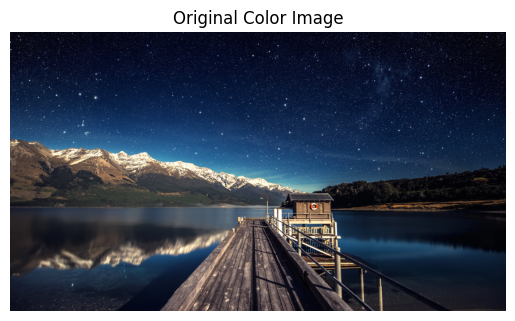

In [18]:
plt.imshow(color_image)
plt.title('Original Color Image')
plt.axis('off')
plt.show()

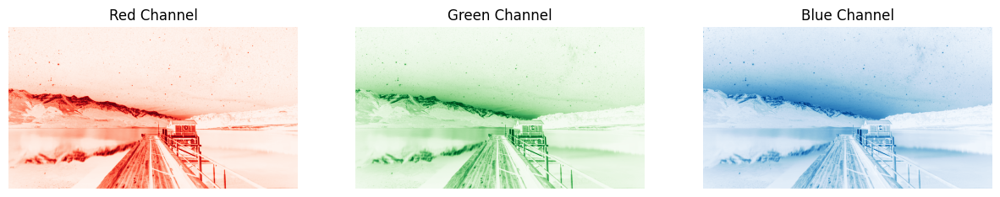

In [19]:
r_channel, g_channel, b_channel = cv2.split(color_image)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(r_channel, cmap='Reds')
plt.title('Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(g_channel, cmap='Greens')
plt.title('Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(b_channel, cmap='Blues')
plt.title('Blue Channel')
plt.axis('off')

plt.show()

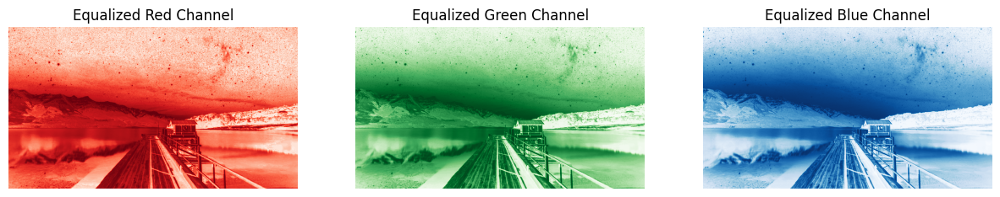

In [20]:
# Apply histogram equalization to each color channel
equalized_r_channel = cv2.equalizeHist(r_channel)
equalized_g_channel = cv2.equalizeHist(g_channel)
equalized_b_channel = cv2.equalizeHist(b_channel)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(equalized_r_channel, cmap='Reds')
plt.title('Equalized Red Channel')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_g_channel, cmap='Greens')
plt.title('Equalized Green Channel')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equalized_b_channel, cmap='Blues')
plt.title('Equalized Blue Channel')
plt.axis('off')

plt.show()

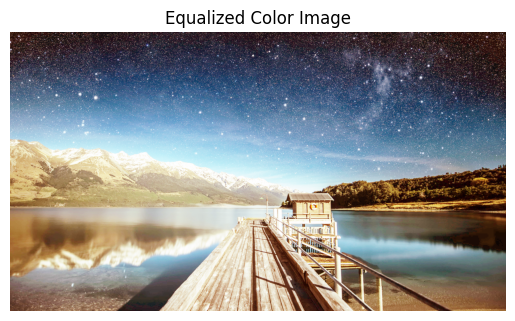

In [21]:
# Combine the equalized channels to form the final color image
equalized_color_image = cv2.merge((equalized_r_channel, equalized_g_channel, equalized_b_channel))

# Display the equalized color image
plt.imshow(equalized_color_image)
plt.title('Equalized Color Image')
plt.axis('off')
plt.show()

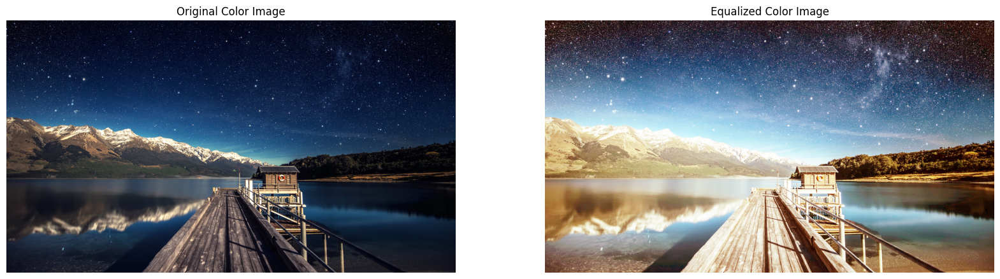

In [22]:
# Display the original and equalized color images side by side for comparison
plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(color_image)
plt.title('Original Color Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_color_image)
plt.title('Equalized Color Image')
plt.axis('off')

plt.show()

The original color image may have lower contrast with less vivid colors.
Histogram equalization applied to each channel enhances the contrast and brightness of each color component.
The equalized color image appears more vibrant and balanced in terms of color distribution.

### Task 4: Histogram Equalization in Different Applications

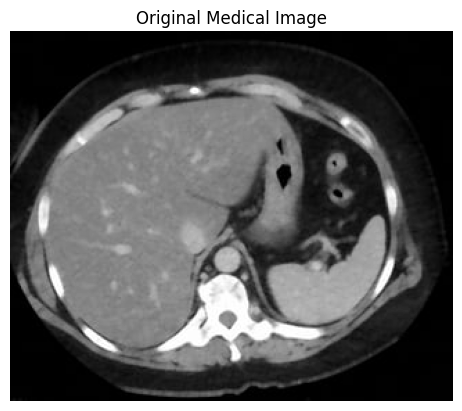

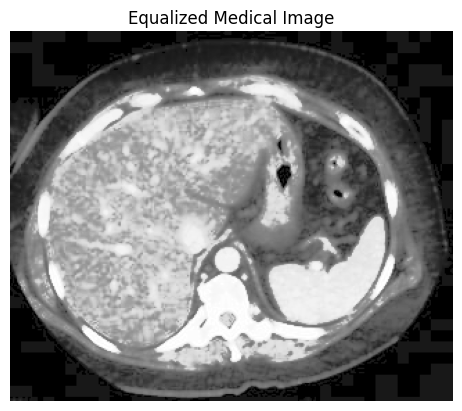

In [23]:
medical_image = cv2.imread('/content/medical_img.jpg', cv2.IMREAD_GRAYSCALE)

equalized_medical_image = cv2.equalizeHist(medical_image)

plt.imshow(medical_image, cmap='gray')
plt.title('Original Medical Image')
plt.axis('off')
plt.show()


plt.imshow(equalized_medical_image, cmap='gray')
plt.title('Equalized Medical Image')
plt.axis('off')
plt.show()

Histogram equalization enhances the contrast in medical images, making it easier to identify and analyze important features such as bones in X-rays or tissues in MRI scans.

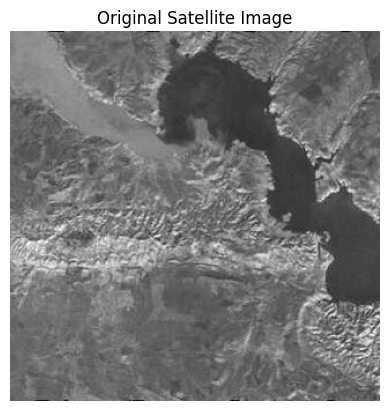

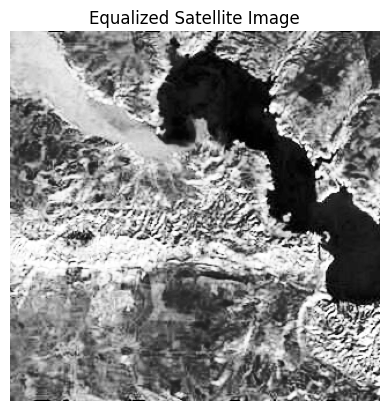

In [24]:
# Load a satellite image
satellite_image = cv2.imread('/content/satellite.jpg', cv2.IMREAD_GRAYSCALE)

equalized_satellite_image = cv2.equalizeHist(satellite_image)

plt.imshow(satellite_image, cmap='gray')
plt.title('Original Satellite Image')
plt.axis('off')
plt.show()

plt.imshow(equalized_satellite_image, cmap='gray')
plt.title('Equalized Satellite Image')
plt.axis('off')
plt.show()

Histogram equalization improves the contrast in satellite images, enhancing the visibility of terrain features and details such as water bodies, vegetation, and urban areas.

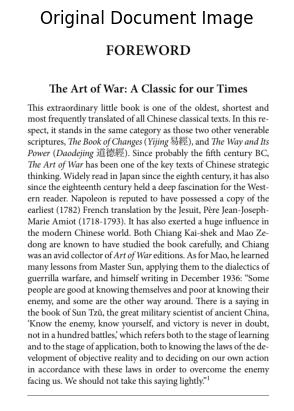

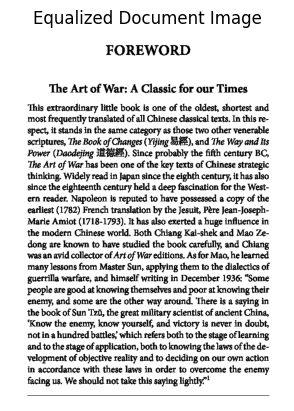

In [25]:
document_image = cv2.imread('/content/doc.png', cv2.IMREAD_GRAYSCALE)

equalized_document_image = cv2.equalizeHist(document_image)

plt.imshow(document_image, cmap='gray')
plt.title('Original Document Image')
plt.axis('off')
plt.show()

print()

plt.imshow(equalized_document_image, cmap='gray')
plt.title('Equalized Document Image')
plt.axis('off')
plt.show()

Histogram equalization enhances the readability and clarity of scanned documents by improving the contrast, making the text more legible and the background cleaner.

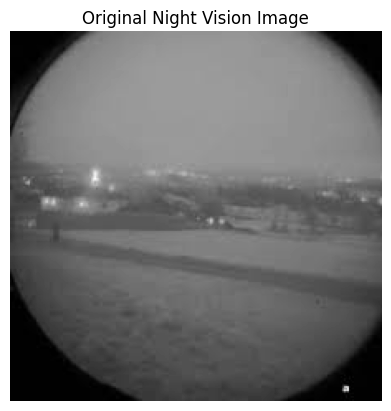

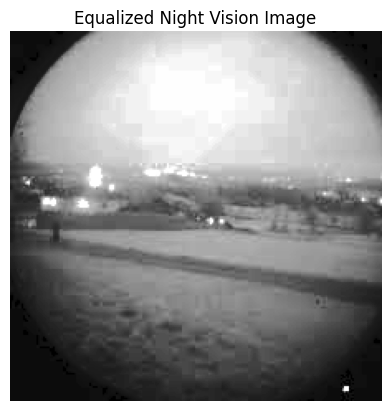

In [26]:
night_vision_image = cv2.imread('/content/nigthvision.jpeg', cv2.IMREAD_GRAYSCALE)

equalized_night_vision_image = cv2.equalizeHist(night_vision_image)

plt.imshow(night_vision_image, cmap='gray')
plt.title('Original Night Vision Image')
plt.axis('off')
plt.show()


plt.imshow(equalized_night_vision_image, cmap='gray')
plt.title('Equalized Night Vision Image')
plt.axis('off')
plt.show()

Histogram equalization enhances the visibility of objects in night vision images by increasing the contrast, making it easier to detect objects in low-light conditions.

### Task 5: Histogram Equalization for Low Contrast Images

In [27]:
low_contrast_image = cv2.imread('/content/lowcontrast.jpeg', cv2.IMREAD_GRAYSCALE)

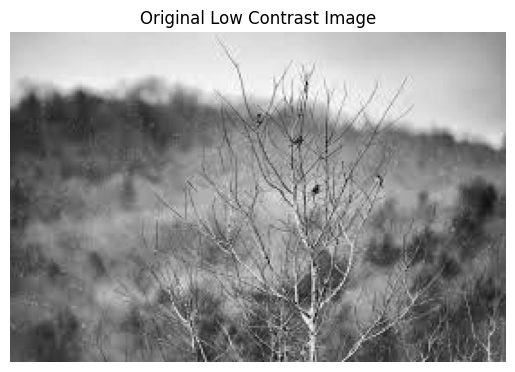

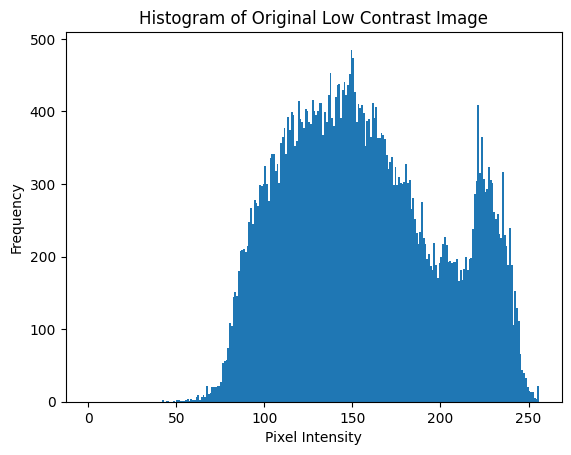

In [28]:
# Display the original low contrast image
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Original Low Contrast Image')
plt.axis('off')
plt.show()

plot_histogram(low_contrast_image, 'Histogram of Original Low Contrast Image')

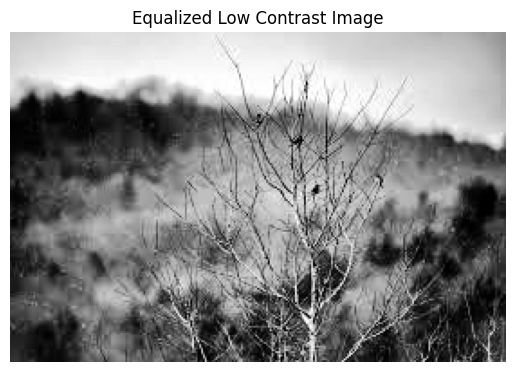

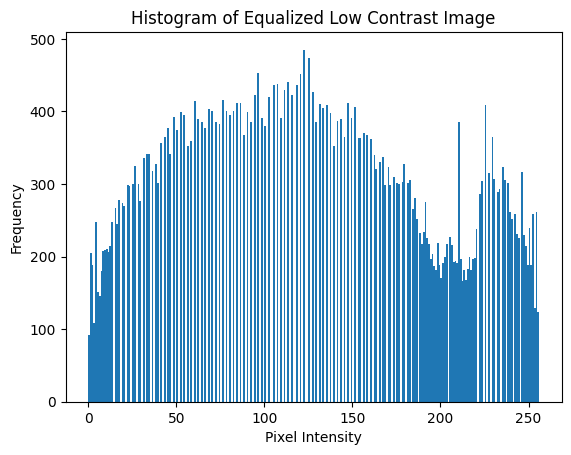

In [29]:
# Apply histogram equalization
equalized_low_contrast_image = cv2.equalizeHist(low_contrast_image)

plt.imshow(equalized_low_contrast_image, cmap='gray')
plt.title('Equalized Low Contrast Image')
plt.axis('off')
plt.show()

print()

plot_histogram(equalized_low_contrast_image, 'Histogram of Equalized Low Contrast Image')

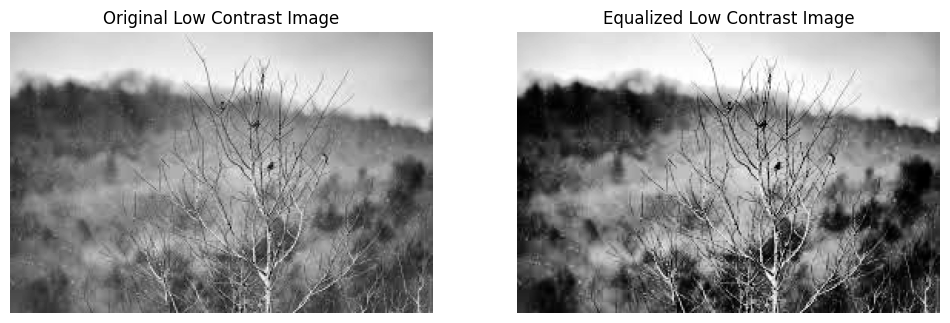

In [30]:
# comparison
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(low_contrast_image, cmap='gray')
plt.title('Original Low Contrast Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(equalized_low_contrast_image, cmap='gray')
plt.title('Equalized Low Contrast Image')
plt.axis('off')

plt.show()

The original low contrast image has a narrow range of pixel intensities, leading to poor visibility of features.
Histogram equalization spreads out the pixel intensities, enhancing the overall contrast and making features more visible.
The equalized image shows significant improvement in contrast, revealing details that were previously hard to see.

### Task 6: Multi-Scale Histogram Equalization

In [45]:
original_image = cv2.imread('/content/intothenight.jpg', cv2.IMREAD_GRAYSCALE)

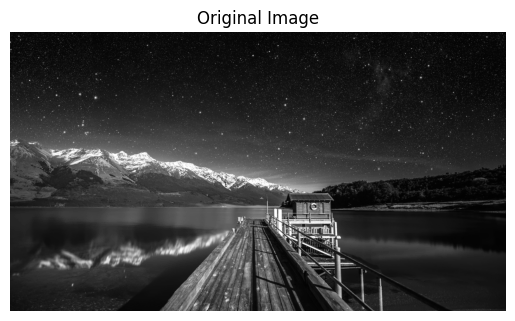

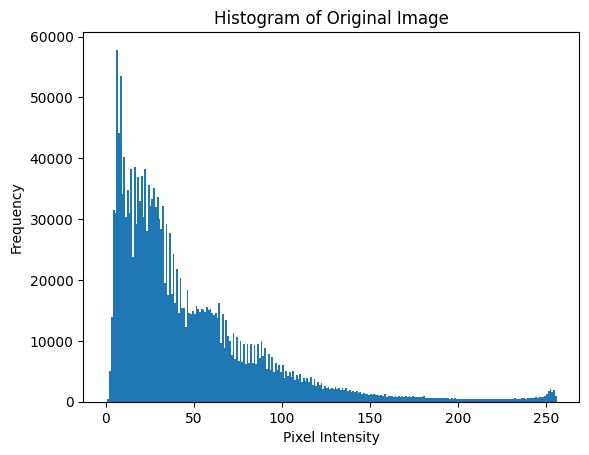

In [46]:
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

plot_histogram(original_image, 'Histogram of Original Image')

In [47]:
# Resize the image to different scales
rescaled_image_50 = cv2.resize(original_image, (0, 0), fx=0.1, fy=0.1)
rescaled_image_100 = original_image.copy()  # 100% scale is the original image
rescaled_image_200 = cv2.resize(original_image, (0, 0), fx=4.0, fy=4.0)

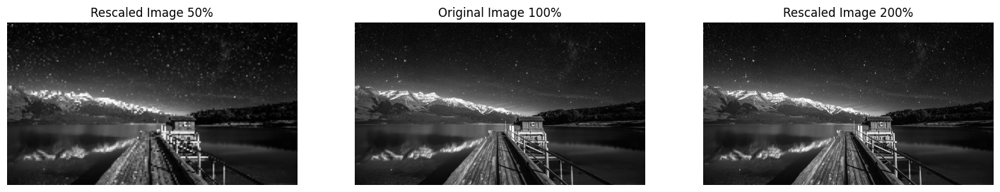

In [48]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(rescaled_image_50, cmap='gray')
plt.title('Rescaled Image 50%')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(rescaled_image_100, cmap='gray')
plt.title('Original Image 100%')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(rescaled_image_200, cmap='gray')
plt.title('Rescaled Image 200%')
plt.axis('off')

plt.show()

In [49]:
# Apply histogram equalization to the resized images
equalized_image_50 = cv2.equalizeHist(rescaled_image_50)
equalized_image_100 = cv2.equalizeHist(rescaled_image_100)
equalized_image_200 = cv2.equalizeHist(rescaled_image_200)

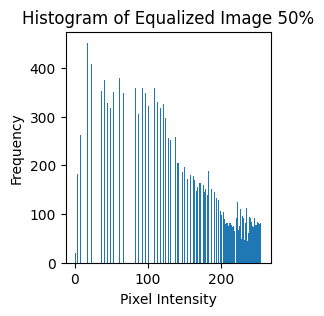

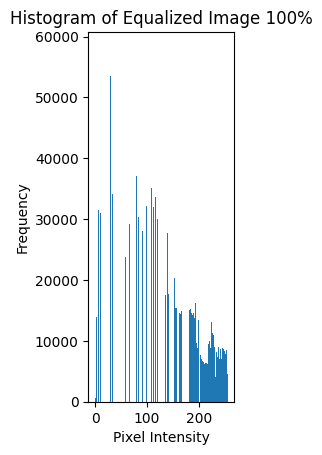

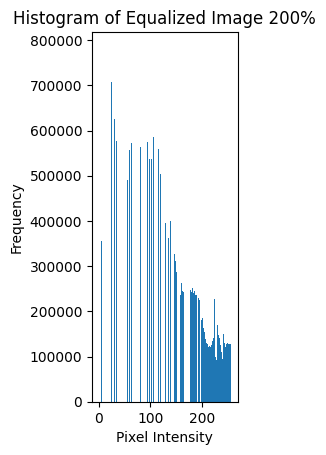

In [50]:
# Plot the histograms of the equalized images
plt.figure(figsize=(9, 3))

plt.subplot(1, 3, 1)
plot_histogram(equalized_image_50, 'Histogram of Equalized Image 50%')

print()

plt.subplot(1, 3, 2)
plot_histogram(equalized_image_100, 'Histogram of Equalized Image 100%')

print()

plt.subplot(1, 3, 3)
plot_histogram(equalized_image_200, 'Histogram of Equalized Image 200%')

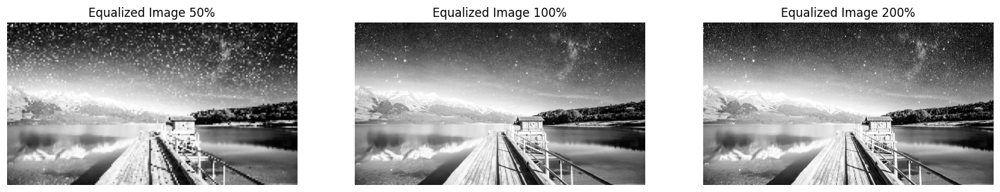

In [51]:
# Display the equalized images
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(equalized_image_50, cmap='gray')
plt.title('Equalized Image 50%')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_image_100, cmap='gray')
plt.title('Equalized Image 100%')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equalized_image_200, cmap='gray')
plt.title('Equalized Image 200%')
plt.axis('off')

plt.show()

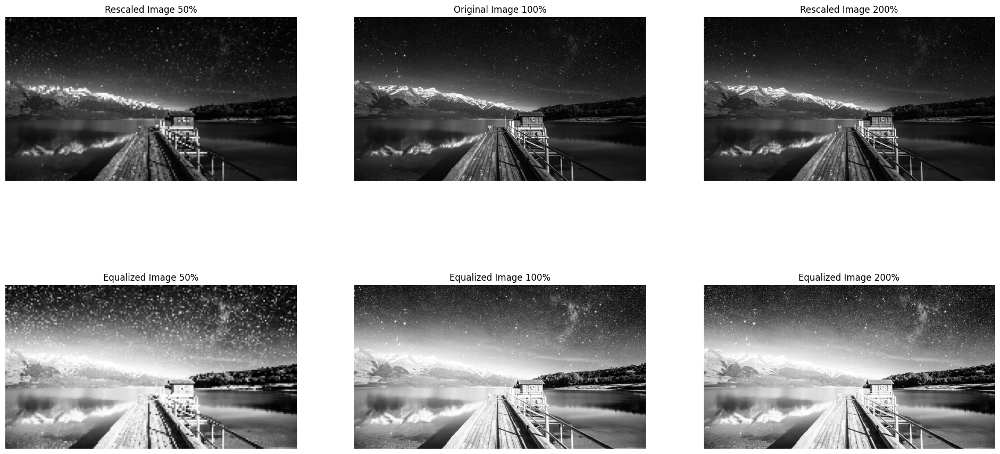

In [52]:
# comparison
plt.figure(figsize=(24, 12))

plt.subplot(2, 3, 1)
plt.imshow(rescaled_image_50, cmap='gray')
plt.title('Rescaled Image 50%')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(rescaled_image_100, cmap='gray')
plt.title('Original Image 100%')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(rescaled_image_200, cmap='gray')
plt.title('Rescaled Image 200%')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(equalized_image_50, cmap='gray')
plt.title('Equalized Image 50%')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(equalized_image_100, cmap='gray')
plt.title('Equalized Image 100%')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(equalized_image_200, cmap='gray')
plt.title('Equalized Image 200%')
plt.axis('off')

plt.show()


Rescaling the image affects the pixel distribution and the histogram equalization results.
Equalizing a downscaled image (50%) can result in loss of detail due to fewer pixels, but it can enhance local contrast more effectively.
Equalizing the original image (100%) provides a balanced enhancement of contrast and details.
Equalizing an upscaled image (200%) might introduce artifacts due to interpolation, but it can enhance fine details more prominently.

> imp note is that we can't really view this in 50% and 200%, setting to 10% and 400% really shows the differences in fine detailing

### Task 7: Histogram Equalization for Image Enhancement

In [54]:
image1 = cv2.imread('/content/lowcontrast.jpeg', cv2.IMREAD_GRAYSCALE)
image2 = cv2.imread('/content/thankyou.jpg', cv2.IMREAD_GRAYSCALE)
image3 = cv2.imread('/content/intothenight.jpg', cv2.IMREAD_GRAYSCALE)

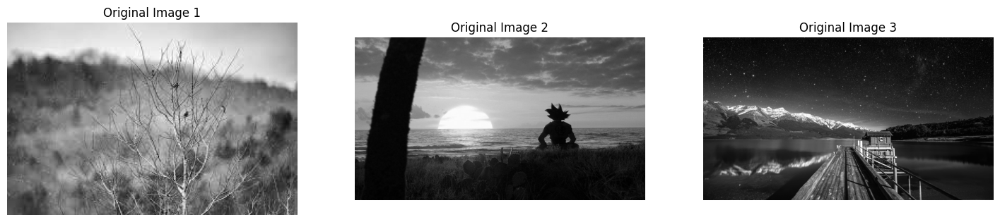

In [55]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(image1, cmap='gray')
plt.title('Original Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(image2, cmap='gray')
plt.title('Original Image 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(image3, cmap='gray')
plt.title('Original Image 3')
plt.axis('off')

plt.show()

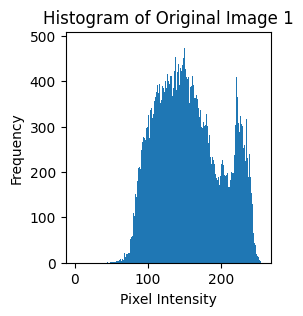

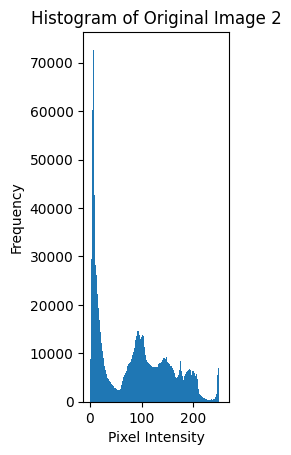

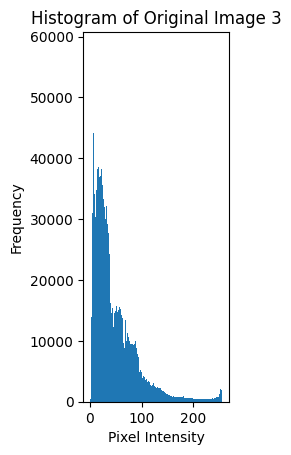

In [57]:
plt.figure(figsize=(9, 3))

plt.subplot(1, 3, 1)
plot_histogram(image1, 'Histogram of Original Image 1')

print()

plt.subplot(1, 3, 2)
plot_histogram(image2, 'Histogram of Original Image 2')

print()

plt.subplot(1, 3, 3)
plot_histogram(image3, 'Histogram of Original Image 3')

In [59]:
equalized_image1 = cv2.equalizeHist(image1)
equalized_image2 = cv2.equalizeHist(image2)
equalized_image3 = cv2.equalizeHist(image3)

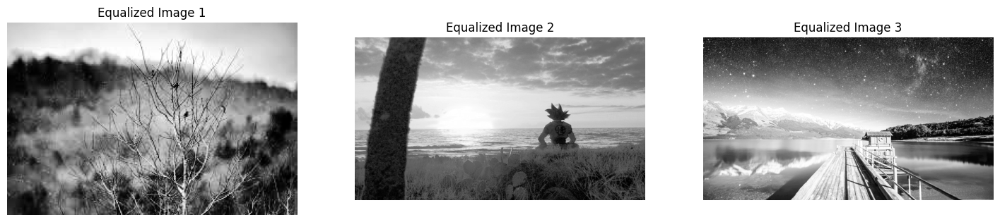

In [60]:
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.imshow(equalized_image1, cmap='gray')
plt.title('Equalized Image 1')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(equalized_image2, cmap='gray')
plt.title('Equalized Image 2')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(equalized_image3, cmap='gray')
plt.title('Equalized Image 3')
plt.axis('off')

plt.show()

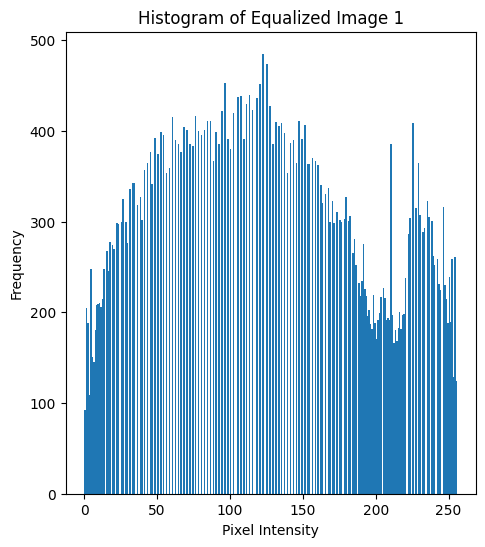

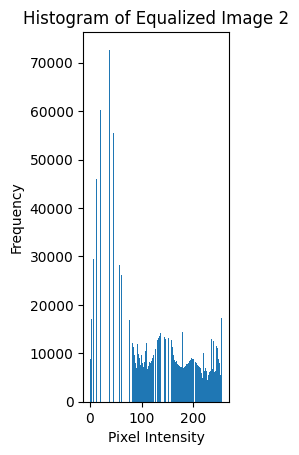

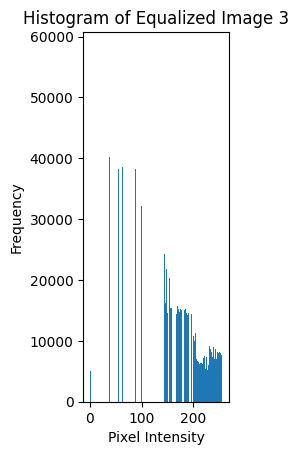

In [61]:

# Plot the histograms of the equalized images
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plot_histogram(equalized_image1, 'Histogram of Equalized Image 1')

plt.subplot(1, 3, 2)
plot_histogram(equalized_image2, 'Histogram of Equalized Image 2')

plt.subplot(1, 3, 3)
plot_histogram(equalized_image3, 'Histogram of Equalized Image 3')

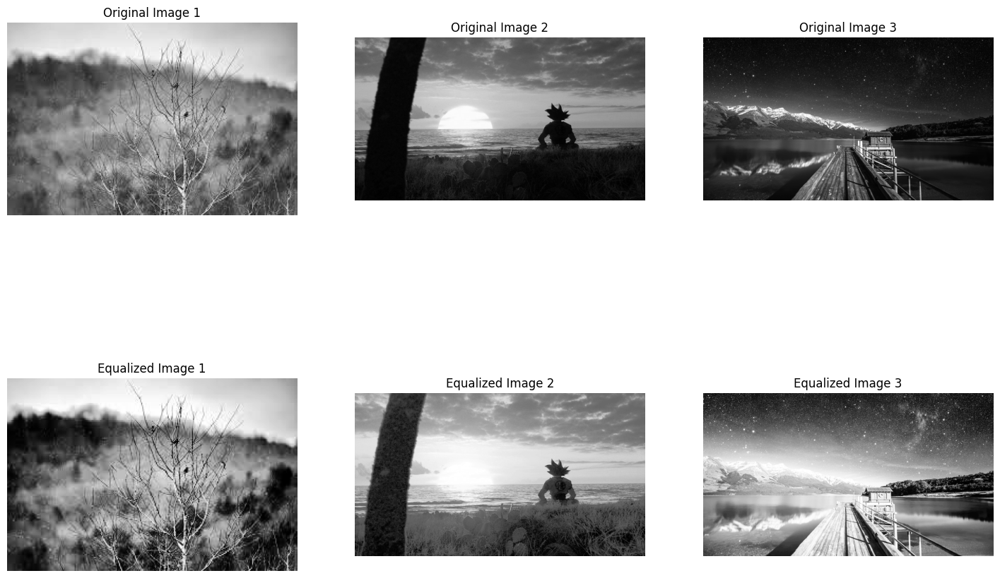

In [63]:
# Display the original and equalized images side by side for comparison
plt.figure(figsize=(18, 12))

plt.subplot(2, 3, 1)
plt.imshow(image1, cmap='gray')
plt.title('Original Image 1')
plt.axis('off')

plt.subplot(2, 3, 2)
plt.imshow(image2, cmap='gray')
plt.title('Original Image 2')
plt.axis('off')

plt.subplot(2, 3, 3)
plt.imshow(image3, cmap='gray')
plt.title('Original Image 3')
plt.axis('off')

plt.subplot(2, 3, 4)
plt.imshow(equalized_image1, cmap='gray')
plt.title('Equalized Image 1')
plt.axis('off')

plt.subplot(2, 3, 5)
plt.imshow(equalized_image2, cmap='gray')
plt.title('Equalized Image 2')
plt.axis('off')

plt.subplot(2, 3, 6)
plt.imshow(equalized_image3, cmap='gray')
plt.title('Equalized Image 3')
plt.axis('off')

plt.show()

Image 1: Histogram equalization has enhanced the contrast, revealing more details in the darker and brighter regions.

Image 2: The equalized image shows improved contrast, making finer details more visible and enhancing the overall clarity.

Image 3: The contrast enhancement in the equalized image brings out subtle details that were not easily visible in the original image.

Overall, histogram equalization improves visual analysis by enhancing contrast and revealing details that were previously hidden due to low contrast or poor lighting conditions.

### Task 8: Histogram Equalization in Image Segmentation

In [81]:
original_image = cv2.imread('/content/thankyou.jpg', cv2.IMREAD_GRAYSCALE)

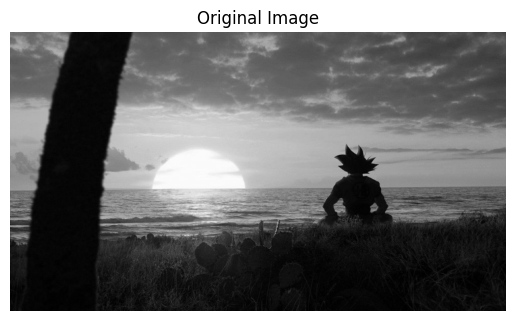

In [82]:
plt.imshow(original_image, cmap='gray')
plt.title('Original Image')
plt.axis('off')
plt.show()

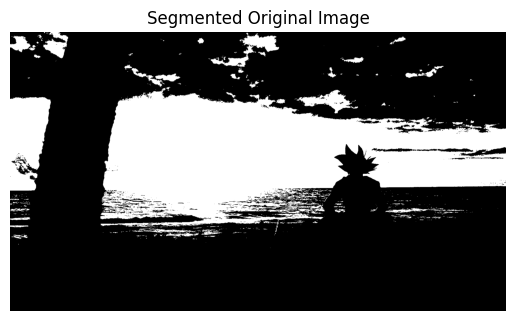

In [83]:
# Perform image segmentation using thresholding
_, segmented_original = cv2.threshold(original_image, 128, 255, cv2.THRESH_BINARY)

# Display the segmented image
plt.imshow(segmented_original, cmap='gray')
plt.title('Segmented Original Image')
plt.axis('off')
plt.show()

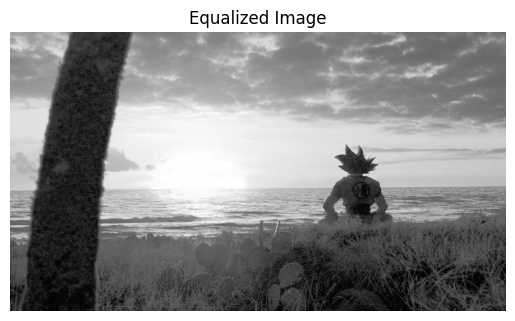

In [84]:
# Apply histogram equalization to the original image
equalized_image = cv2.equalizeHist(original_image)

plt.imshow(equalized_image, cmap='gray')
plt.title('Equalized Image')
plt.axis('off')
plt.show()

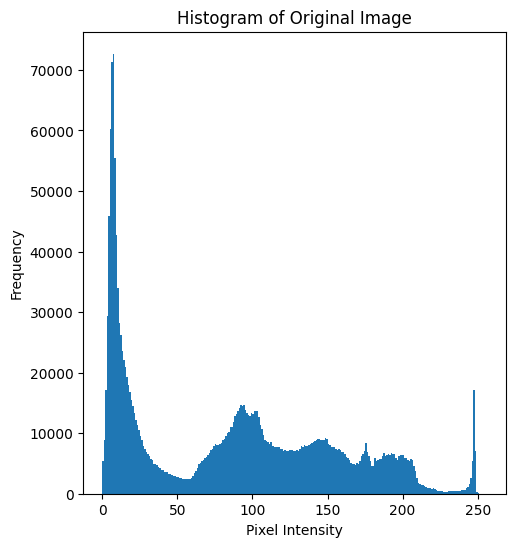

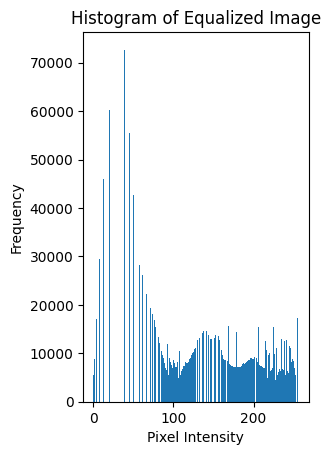

In [85]:
# Plot the histograms of the original and equalized images
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plot_histogram(original_image, 'Histogram of Original Image')

print()

plt.subplot(1, 2, 2)
plot_histogram(equalized_image, 'Histogram of Equalized Image')

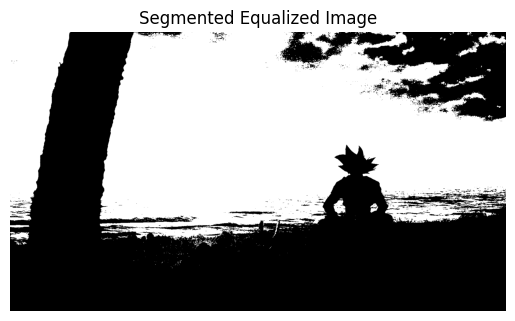

In [86]:
# Perform image segmentation on the equalized image using thresholding
_, segmented_equalized = cv2.threshold(equalized_image, 128, 255, cv2.THRESH_BINARY)

# Display the segmented equalized image
plt.imshow(segmented_equalized, cmap='gray')
plt.title('Segmented Equalized Image')
plt.axis('off')
plt.show()

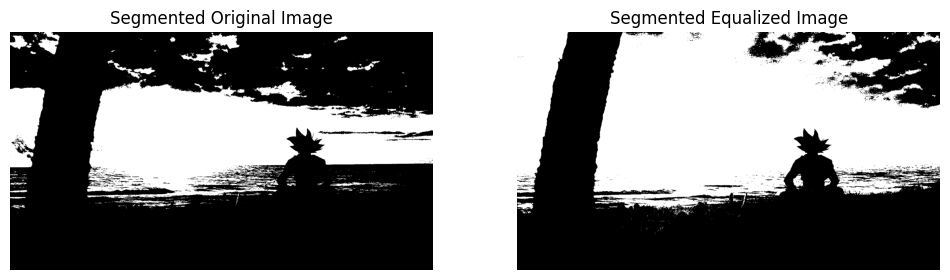

In [87]:
# comparison
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(segmented_original, cmap='gray')
plt.title('Segmented Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(segmented_equalized, cmap='gray')
plt.title('Segmented Equalized Image')
plt.axis('off')

plt.show()

Original Image Segmentation: The segmentation result from the original image may have areas where features are not clearly separated due to low contrast.

Equalized Image Segmentation: The segmentation result from the equalized image shows better separation of features, with improved accuracy in identifying distinct regions.

Histogram equalization enhances contrast, which can lead to more accurate and effective segmentation. Improved contrast helps in better distinguishing between different regions in the image, making the segmentation process more reliable.